In [5]:
# imports from custom library
import sys
sys.path.append('../../')
import matplotlib.pyplot as plt
from mlrefined_libraries import superlearn_library as superlearn
from mlrefined_libraries import calculus_library as callib
from mlrefined_libraries import math_optimization_library as optlib
import autograd.numpy as np
import math
import pandas as pd
from mlrefined_libraries import calculus_library as calclib

%matplotlib notebook

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Part 1: The single input derivative and numerical differentiation

Press the botton 'Toggle code' below to toggle code on and off for entire this presentation.

In [3]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

>Mathematical optimization schemes are the workhorse of machine learning - and at their core lies the derivative.  Because of this an intuitive and rigorous understanding of the derivative - as well as other vital elements of calculus - serves one well in understanding mathematical optimization, and hence machine learning / deep learning more generally. 

# 1.  Derivatives at a point

# 1.  Derivatives at a point

- The derivative is a simple tool for understanding a mathematical function *locally* - meaning at and around a single point.  


- More specifically the derivative at a point defines the best *linear approximation* - a line in two dimensions, a hyperplane in higher dimensions - that matches the given function at that point as well as a line / hyperplane can.  

- Why would someone need / come up with such an idea?  Because most of the mathematical functions we deal with in machine learning, mathematical optimization, and science in general are *too high dimensional for us to examine by eye*.  Because they live in higher dimensions we need tools (e.g., calculus) to help us understand and intuit their behavior.

## First: just the pictures, please

Lets begin exploring this idea in pictures before jumping into the math.  Lets examine a few candidate functions  - beginning with the standard sinusoid

\begin{equation}
g(w) = \text{sin}(w)
\end{equation}

In the next slide we draw this function over a small range of its inputs, and then at each point draw the line defined by the function's derivative there on top.  

Move the slider back and forth below |to see the <span style="color:#32cd32"> tangent line defined by the derivative of this function shown in greeen </span> - at each <span style="color:red"> input $w$ is drawn as a red 'X' </span>, where the <span style="color:red"> output $g(w)$ is a red circle </span>.


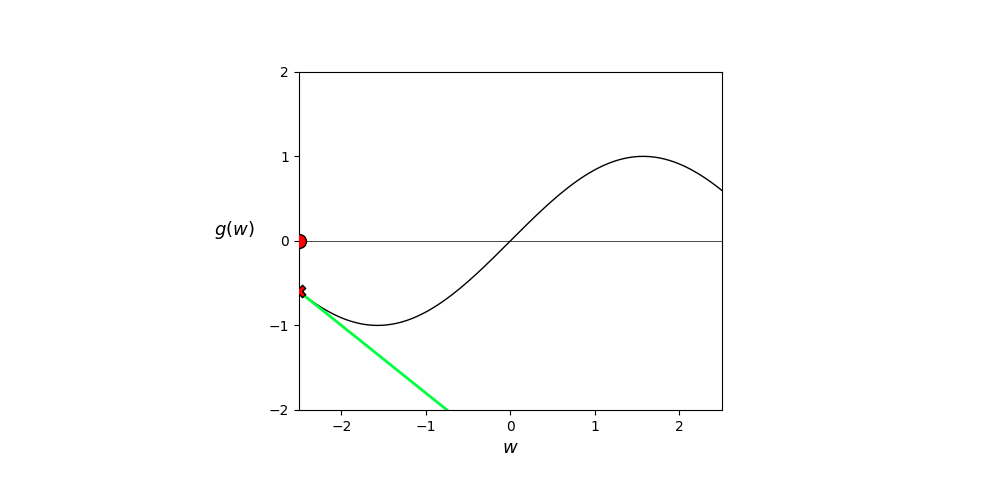
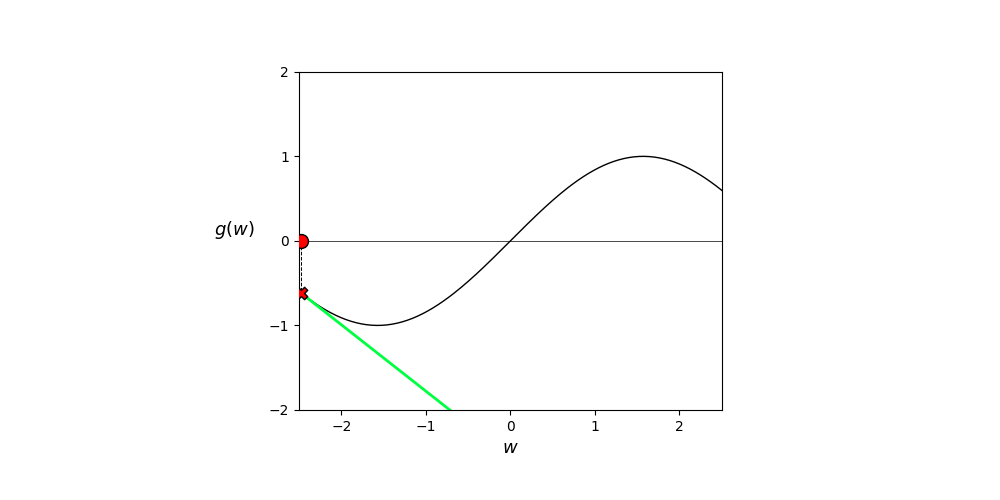
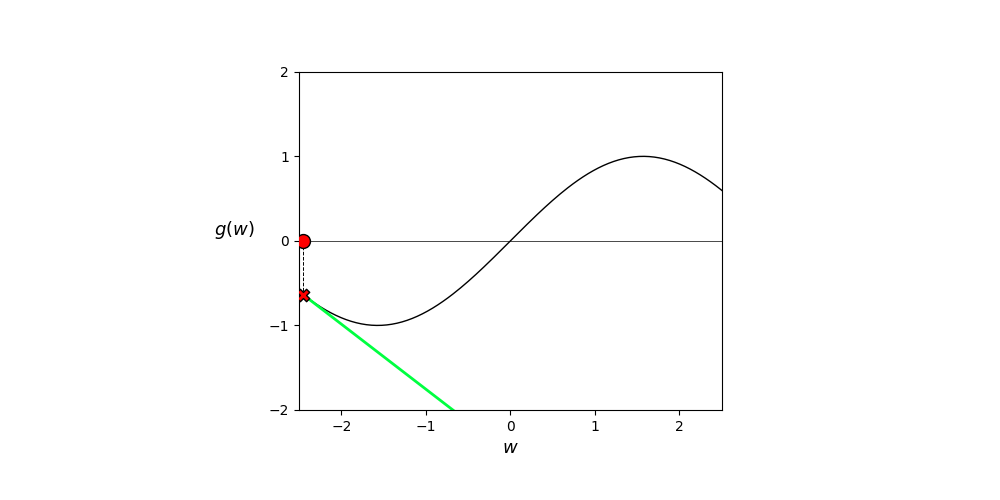
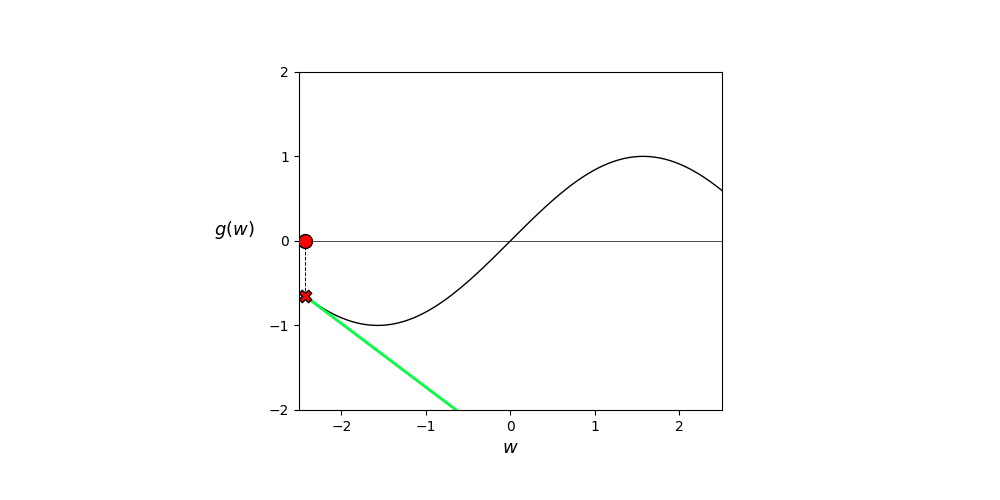
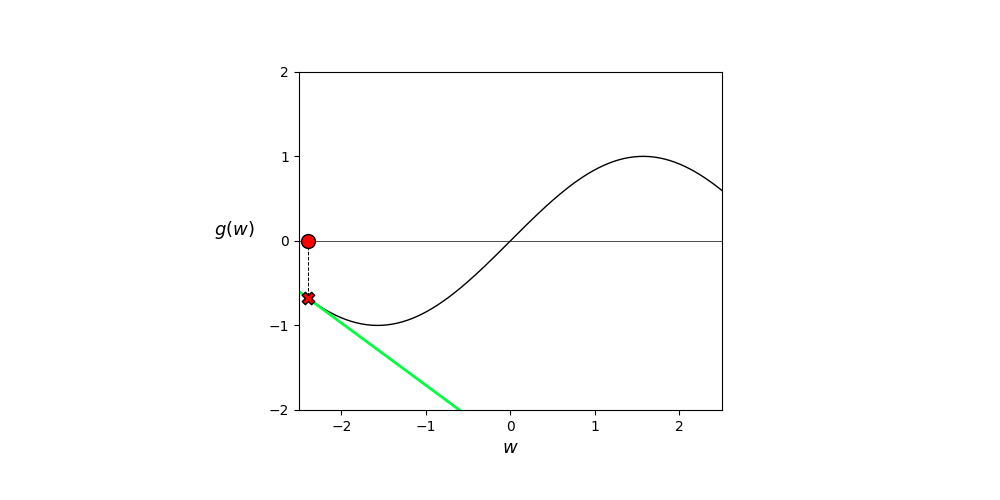
...
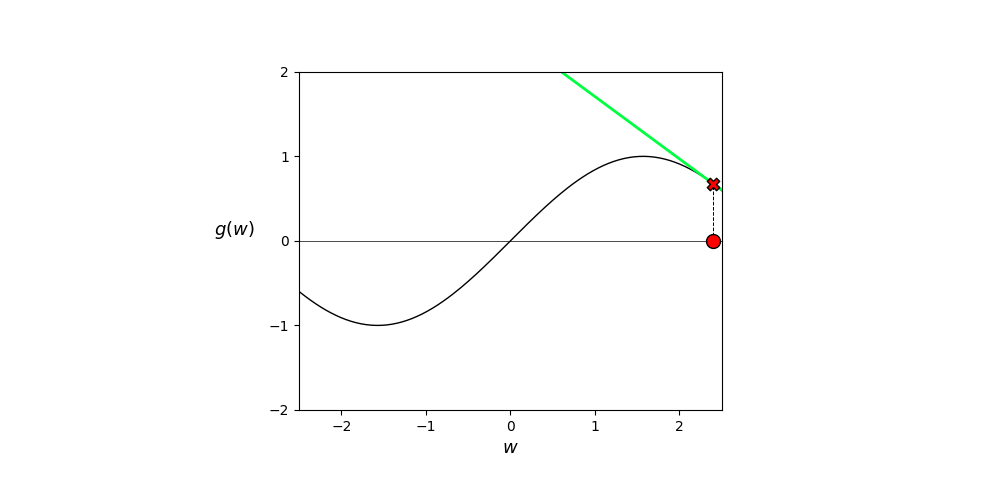
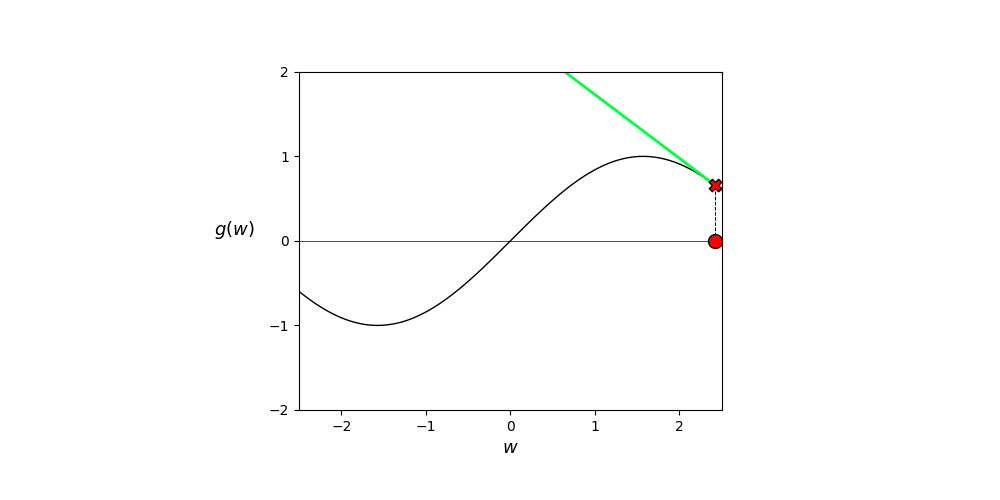
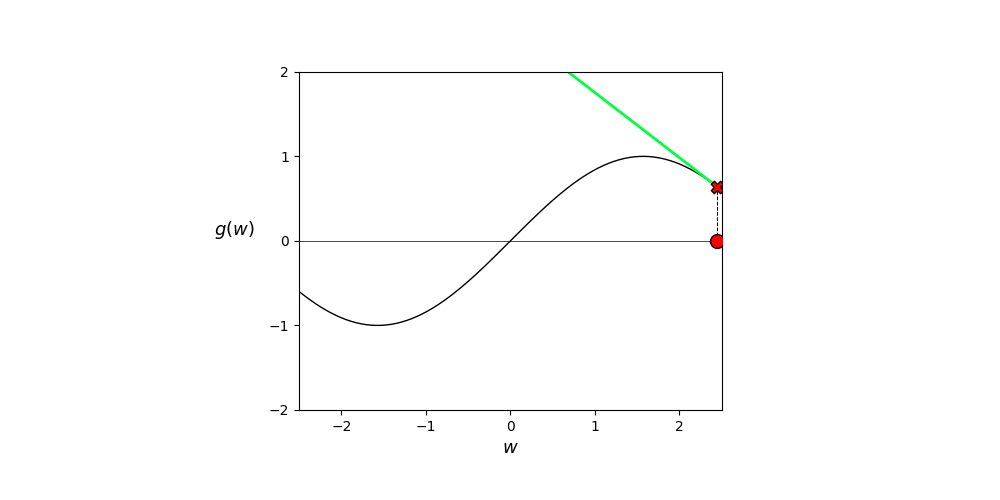
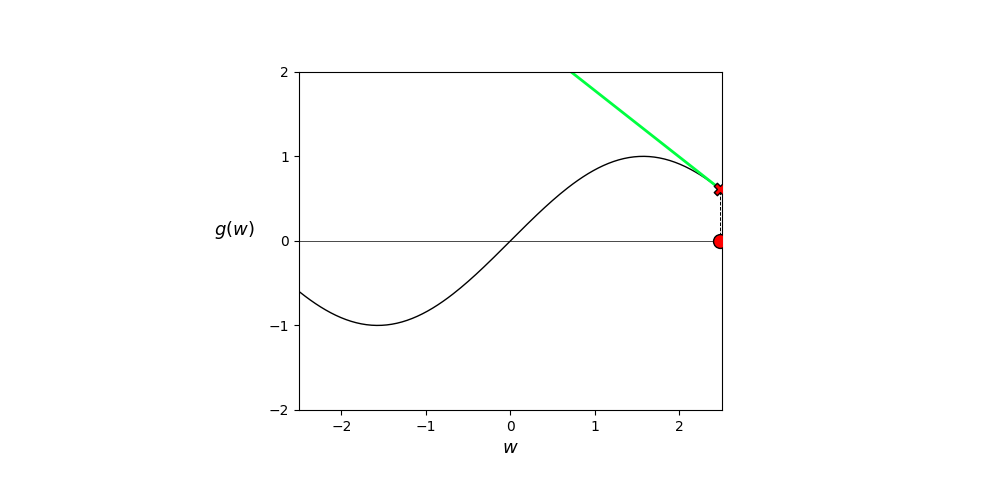
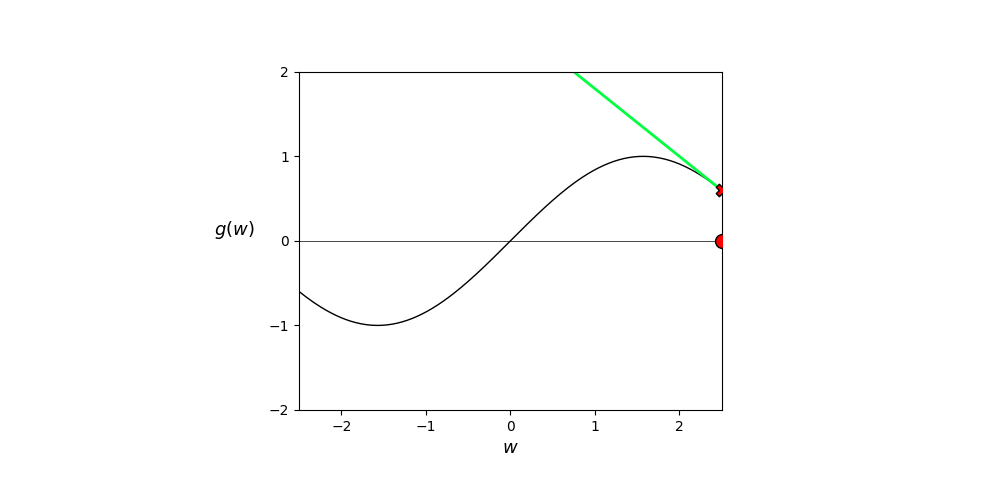

In [10]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.sin(w)

# create an instance of the visualizer with this function 
taylor_viz = calclib.taylor2d_viz.visualizer(g = g)

# run the visualizer for our chosen input function
taylor_viz.draw_it(first_order = True,num_frames = 200)

> The derivative at a point defines a line that is always tangent to a function, encodes its steepness at that point, and generally matches the underlying function near the point locally.  In short - the derivative at a point is the slope of the tangent line at that point.

This applies to any function - e.g., using the same widget toy for the following

\begin{equation}
g(w) = \text{sin}(4w) + 0.1w^2
\end{equation}

we can see the tangent line defined by its derivative at each input point.


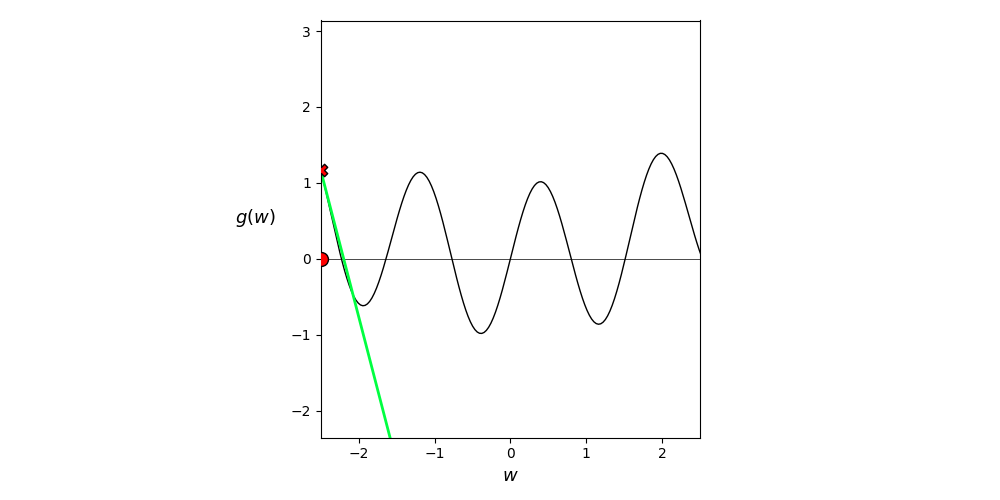
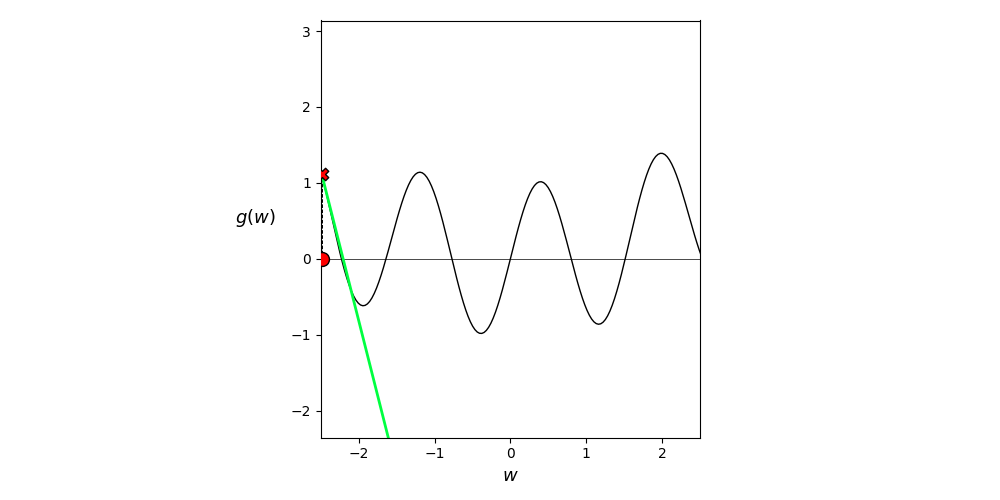
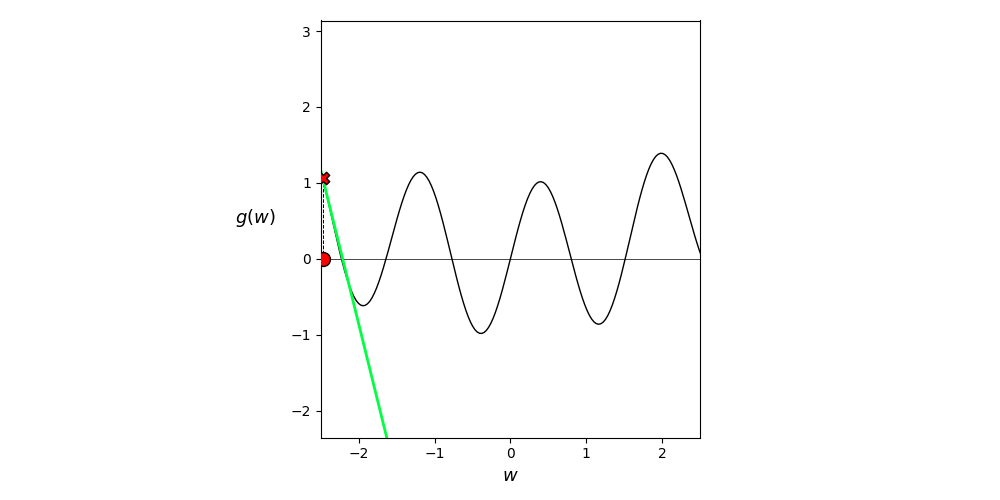
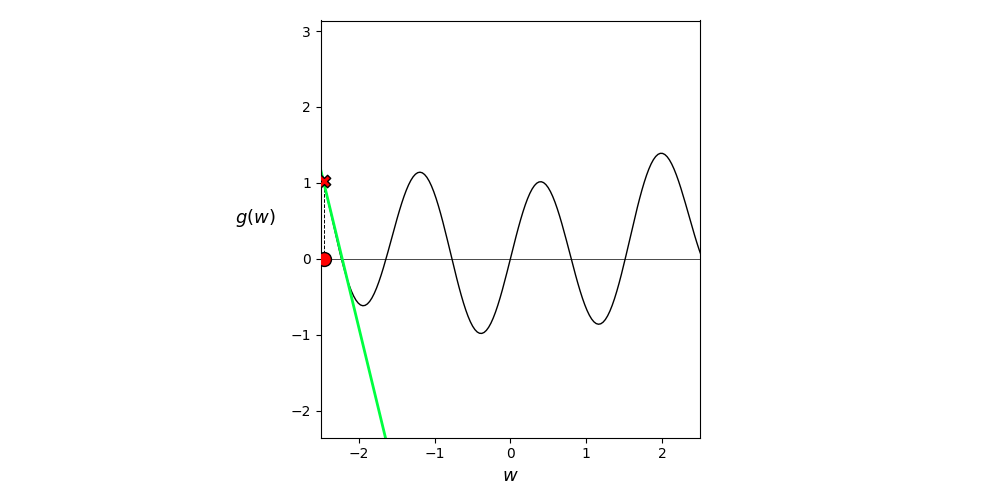
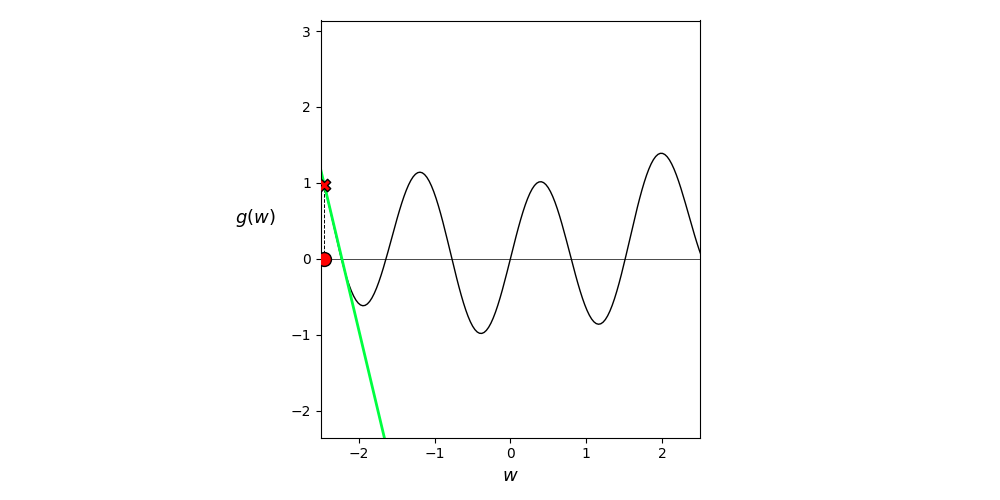
...
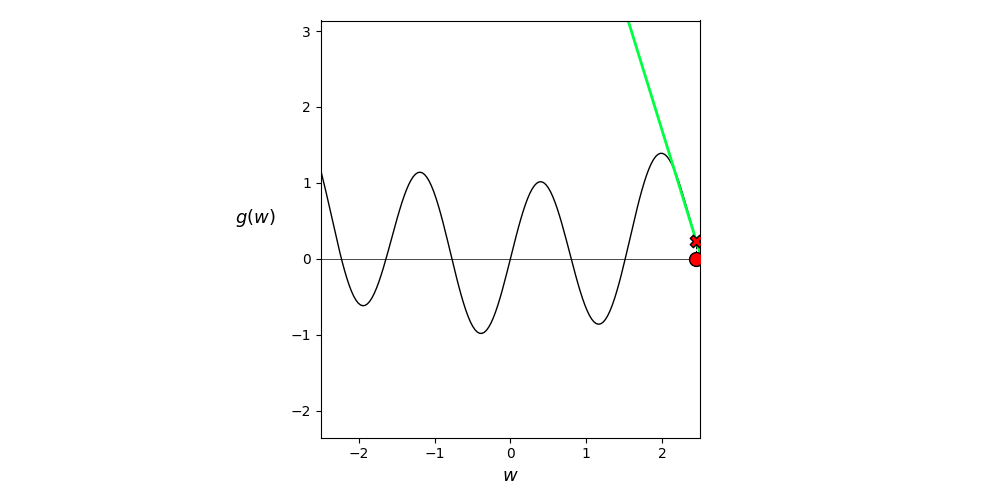
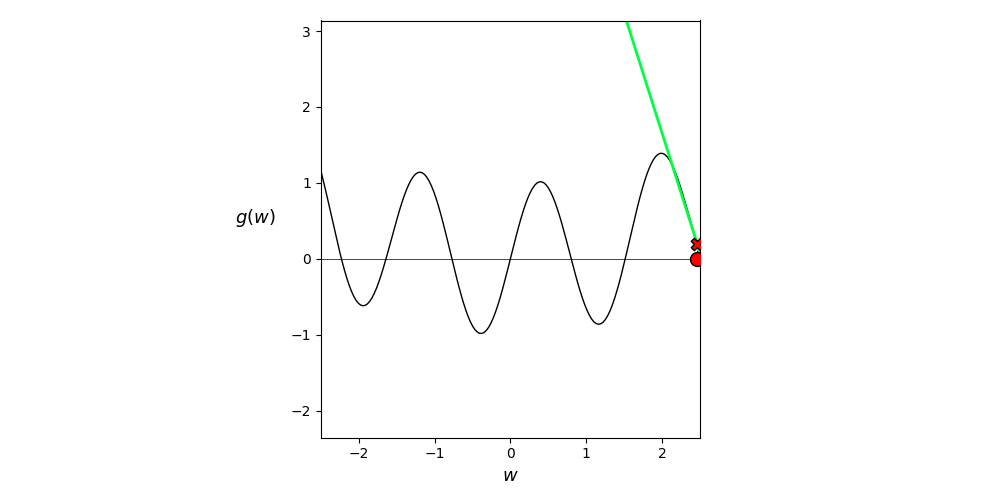
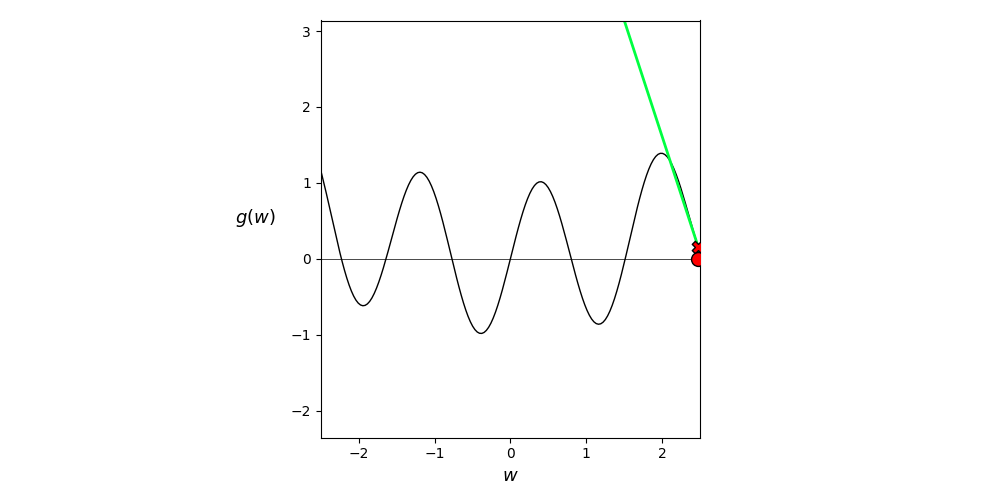
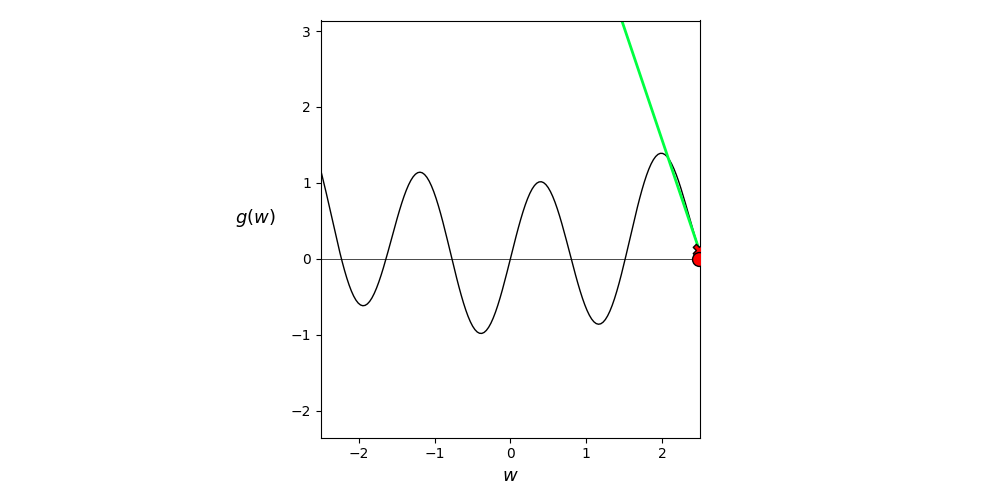
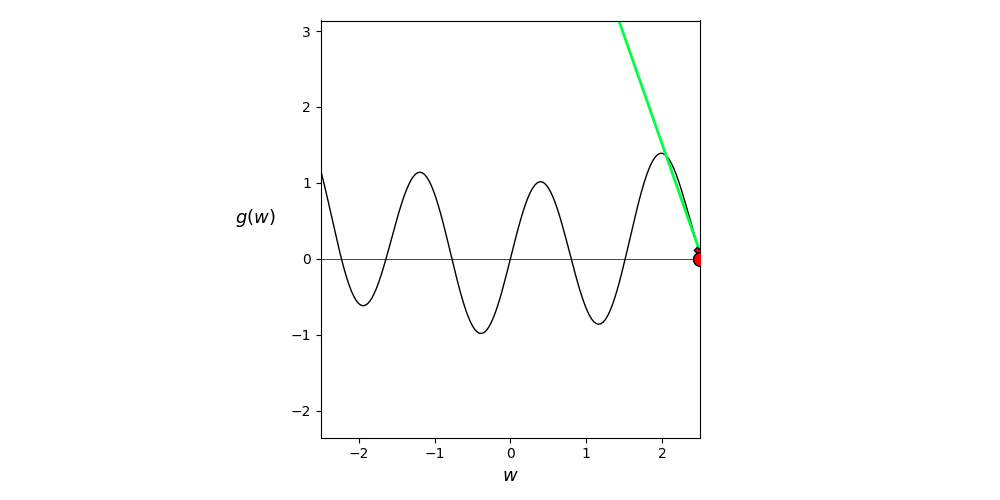

In [13]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.sin(4*w) + 0.1*w**2

# create an instance of the visualizer with this function 
taylor_viz = calclib.taylor2d_viz.visualizer(g = g)

# run the visualizer for our chosen input function
taylor_viz.draw_it(first_order = True,num_frames = 400)

## Derivatives of multi-input functions

- The analagous notion holds for derivatives of multi-input functions as well

- The only difference: such a function has multiple derivatives, and our tangent line becomes a hyperplane.  

For example the simple sinusoid in 3 dimensions given by 

\begin{equation}
g(w_0, w_1) = \text{sin}(w_0) 
\end{equation}

has tangent hyperplane defined by its derivatives at a point that looks like below

<IPython.core.display.Javascript object>


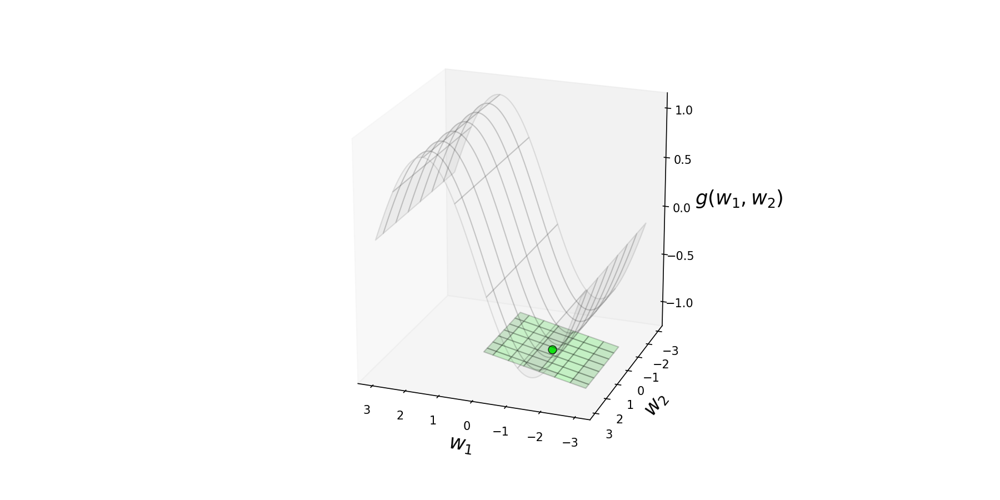

In [16]:
# define the function to plot, as well as a point at which to draw tangent hyperplane
g = lambda w: np.sin(w[0])
w_val = [-1.5,1]

# load in function to examine
taylor_viz = calclib.taylor3d_viz.visualizer(g = g)

# start examination
taylor_viz.draw_it(w_val = w_val,first_order = True,view = [20,110]);